docker run -it --rm --network host -v "$(pwd)"/ship:/home/jovyan/work/ship -v "$(pwd)"/.kube:/home/jovyan/.kube --name=morozyto_wrf_jupyter  -e GRANT_SUDO=yes --user root jupyter/datascience-notebook:b418b67c225b
ssh -L 10001:localhost:8888 amorozov@84.201.178.14
http://127.0.0.1:10001

sftp amorozov@84.201.178.14

docker exec -it cont_id bash
/opt/conda/bin/python -m ipykernel install --prefix=/opt/conda --name 'wrf_env' # then choose new kernel and restart


#TODO:
запуск на неделю должен быть успешным. N_jobs 10 or 12?
рассчет score пока что не полный в плане данных?
Попросить больше Диска - жду активностей от Андрея и Димы
add more model params - too hard.  https://www2.mmm.ucar.edu/wrf/users/physics/phys_references.html
use code from Sergei notebook for points on map? Maybe later.

In [2]:
!/opt/conda/bin/conda install -y -c conda-forge eccodes
!/opt/conda/bin/pip3 install eccodes
!/opt/conda/bin/pip3 install xarray
!/opt/conda/bin/pip3 install netCDF4
!/opt/conda/bin/pip3 install kubernetes
!/opt/conda/bin/pip3 install sklearn
!/opt/conda/bin/pip3 install torch
!/opt/conda/bin/pip3 install pandas
!/opt/conda/bin/pip3 install catboost

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.11.0
  latest version: 4.12.0

Please update conda by running

    $ conda update -n base conda



# All requested packages already installed.

     |████████████████████████████████| 750.6 MB 3.3 kB/s             
     |████████████████████████████████| 76.6 MB 115.7 MB/s            
     |████████████████████████████████| 15.2 MB 58.5 MB/s            
     |████████████████████████████████| 46 kB 803 kB/s             


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split

In [2]:
import logging
import time

current_ts = int(time.time())

logging.basicConfig(
    format='%(asctime)s %(levelname)-8s %(message)s',
    level=logging.DEBUG,
    datefmt='%Y-%m-%d %H:%M:%S',
    filename=f'script_{current_ts}.log',
    encoding='utf-8',
)

In [68]:
import itertools
import random

random.seed(current_ts)

def sleep_some_random_time(min_time = 1, max_random_addition = 2):
    sleep_time = min_time + random.randint(0, max_random_addition)
    logging.info(f"Going to sleep {sleep_time} seconds.")
    time.sleep(sleep_time)


def iterate_wrf_model_params():

    def check_restrictions(model_params):
        if model_params["BL_PBL_PHYSICS"] == 5:
            if model_params["SF_SFCLAY_PHYSICS"] not in [1, 5]:
                return False
        elif model_params["BL_PBL_PHYSICS"] == 7:
            if model_params["SF_SFCLAY_PHYSICS"] not in [1, 7]:
                return False
        elif model_params["BL_PBL_PHYSICS"] == 10:
            if model_params["SF_SFCLAY_PHYSICS"] not in [10]:
                return False
        elif model_params["BL_PBL_PHYSICS"] == 11:
            if model_params["SF_SFCLAY_PHYSICS"] not in [1]:
                return False
        return True

    available_params = {
        "MP_PHYSICS": [8, 17, 18],
        "RA_LW_PHYSICS": [4],
        "RA_SW_PHYSICS": [4, 5],
        "RADT": [6],
        "SF_SFCLAY_PHYSICS": [1, 5, 7, 10],
        "SF_SURFACE_PHYSICS": [2, 3],
        "SF_URBAN_PHYSICS": [1],
        "BL_PBL_PHYSICS": [5, 7, 10, 11],
        "CU_PHYSICS": [3, 16],
        "DIFF_6TH_OPT": [0, 2],
        "DIFF_OPT": [1, 2],
        "KM_OPT": [4],
    }

    keys = list(available_params)
    all_possible_model_params = [dict(zip(keys, values)) for values in itertools.product(*map(available_params.get, keys))]
    random.shuffle(all_possible_model_params)

    while True:
        model_params = random.choice(all_possible_model_params)
        if check_restrictions(model_params):
            yield model_params
        else:
            logging.info(f"Restricted params {model_params}")

def iterate_wrf_geo_params(only_geo_params=False):
    geo_params = [
        # Moscow-close regions
        #{"LAT": "55.00", "LON":  "38.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Moscow
        {"LAT": "55.00", "LON":  "50.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Kazan
        {"LAT": "55.00", "LON":  "28.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Belorussian
        # Ural-close regions
        #{"LAT": "54.00", "LON":  "58.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Yekaterinburg
        #{"LAT": "60.00", "LON":  "59.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Hanty-Mansyisk
        #{"LAT": "66.00", "LON":  "59.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Salehard-close
        # Baikal-close regions
        #{"LAT": "53.00", "LON":  "84.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Hakasia
        #{"LAT": "53.00", "LON":  "95.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Tiva
        #{"LAT": "53.00", "LON": "112.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Buryatia
        # North-close regions
        #{"LAT": "65.00", "LON":  "31.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Kolskiy
        #{"LAT": "68.00", "LON":  "56.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Nenetskiy
        #{"LAT": "68.00", "LON":  "74.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Yamalo-Nenetskiy
        # Kamchatka-close regions
        #{"LAT": "62.00", "LON": "153.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Magadan
        #{"LAT": "56.00", "LON": "159.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Kamchatka
        #{"LAT": "58.00", "LON": "134.00", "E_WE": 100, "E_SN": 100, "DX": 6000}, # Khabarovsk
    ]
    if only_geo_params:
        for lat in range(-70, 70, 3):
            for lon in range(-180, 180, 3):
                params = {"LAT": str(lat) + ".00", "LON": str(lon) + ".00", "E_WE": 100, "E_SN": 100, "DX": 6000}
                params["TIME_STEP"] = (params["DX"] // 1000) * 5
                yield params
    else:
        while True:
            params = random.choice(geo_params)
            params["TIME_STEP"] = (params["DX"] // 1000) * 5
            yield params

def iterate_wrf_time_params():
    time_params = [
        {"START_DATE": "2020-07-15_00:00:00", "END_DATE": "2020-07-22_00:00:00", "INTERVAL_SECONDS": "10800"},
    ]
    while True:
        yield random.choice(time_params)

def get_wrf_launch_configuration(only_geo_params=False, max_generated_points_count=10 ** 6):
    time_params_gen = iterate_wrf_time_params()
    model_params_gen = iterate_wrf_model_params()
    geo_params_gen = iterate_wrf_geo_params(only_geo_params=only_geo_params)

    if only_geo_params:
        for geo_param in geo_params_gen:
            time_param = {"START_DATE": "2020-07-15_00:00:00", "END_DATE": "2020-07-15_06:00:00", "INTERVAL_SECONDS": "10800"}
            yield {**geo_param, **time_param, **next(model_params_gen)}
        return

    points_cnt = 0
    while points_cnt < max_generated_points_count:
        model_params = next(model_params_gen)
        geo_params = next(geo_params_gen)
        time_params = next(time_params_gen)
        yield {**model_params, **geo_params, **time_params}
        points_cnt += 1

In [27]:
from datetime import datetime

class JobSchedulerContext:
    def __init__(self):
        pass

    @classmethod
    def make_job_context(cls, job_id, wrf_params, local_work_dir, job_work_dir, only_geo_params=False):

        kuber_job_prefix = 'calculate-geo-middle' if only_geo_params else 'calculate-points'
        results_dir_name = 'geo_results_middle' if only_geo_params else 'results'

        return {
            "id": job_id,
            "kuber_job_id": f"{kuber_job_prefix}-{job_id}",
            "wrf_params": wrf_params,
            "local_dir_with_results": os.path.join(local_work_dir, results_dir_name, job_id),
            "job_dir_with_results": os.path.join(job_work_dir, results_dir_name, job_id),
            "score": None,
            "error_msg": None
        }

    @classmethod
    def get_scheduler_job_id(cls, job_context):
        return job_context["id"]

    @classmethod
    def get_kuber_job_id(cls, job_context):
        return job_context["kuber_job_id"]

    @classmethod
    def get_wrf_params(cls, job_context):
        return job_context["wrf_params"]

    @classmethod
    def get_local_dir_with_results(cls, job_context):
        return job_context["local_dir_with_results"]

    @classmethod
    def get_job_dir_with_results(cls, job_context):
        return job_context["job_dir_with_results"]

    @classmethod
    def get_score(cls, job_context):
        return job_context["score"]

    @classmethod
    def set_score_result(cls, job_context, score_result):
        job_context["score_result"] = score_result

    @classmethod
    def set_error_msg(cls, job_context, error_msg):
        job_context["error_msg"] = error_msg

    @classmethod
    def calculate_expected_count_of_results_files(cls, job_context):
        wrf_params = JobSchedulerContext.get_wrf_params(job_context)
        start_date = datetime.strptime(wrf_params["START_DATE"], '%Y-%m-%d_%H:%M:%S')
        end_date = datetime.strptime(wrf_params["END_DATE"], '%Y-%m-%d_%H:%M:%S')
        interval_in_seconds = 3600
        delta_in_seconds = (end_date - start_date).total_seconds()
        return delta_in_seconds // interval_in_seconds + 1


In [90]:
import json

class JobSchedulerState:
    def __init__(self, state_path):
        self._state_path = state_path
        self._state = None
        self._seen_job_params = set()
        self._load()

    def _load(self):
        logging.debug("_load_state")
        if os.path.exists(self._state_path):
            logging.info("Loading state from file")
            with open(self._state_path) as f:
                self._state = json.load(f)

            completed_jobs = []
            for job in self._state["completed_jobs"]:
                if not isinstance(job["wrf_params"]["LAT"], str):
                    job["wrf_params"]["LAT"] = str(job["wrf_params"]["LAT"]) + "0"
                    job["wrf_params"]["LON"] = str(job["wrf_params"]["LON"]) + "0"
                    job["wrf_params"]["INTERVAL_SECONDS"] = str(job["wrf_params"]["INTERVAL_SECONDS"])

                job_hash = self._make_hashable_of_params(JobSchedulerContext.get_wrf_params(job))
                if job_hash not in self._seen_job_params:
                    completed_jobs.append(job)
                    self._seen_job_params.add(job_hash)
            self._state["completed_jobs"] = completed_jobs

            failed_jobs = []
            for job in self._state["failed_jobs"]:
                if not isinstance(job["wrf_params"]["LAT"], str):
                    job["wrf_params"]["LAT"] = str(job["wrf_params"]["LAT"]) + "0"
                    job["wrf_params"]["LON"] = str(job["wrf_params"]["LON"]) + "0"
                    job["wrf_params"]["INTERVAL_SECONDS"] = str(job["wrf_params"]["INTERVAL_SECONDS"])

                job_hash = self._make_hashable_of_params(JobSchedulerContext.get_wrf_params(job))
                if job_hash not in self._seen_job_params:
                    failed_jobs.append(job)
                    self._seen_job_params.add(job_hash)
            self._state["failed_jobs"] = failed_jobs

            new_running_jobs = [] # kostyl needed for case is scheduler disabled when processing running jobs
            for job in self._state["running_jobs"]:
                h = self._make_hashable_of_params(JobSchedulerContext.get_wrf_params(job))
                if h in self._seen_job_params:
                    logging.warning(f"Skip job with metadata {job} due to we have already process these params.")
                else:
                    self._seen_job_params.add(h)
                    new_running_jobs.append(job)
            self.set_running_jobs(new_running_jobs)

        else:
            logging.info("Initing state for the first time")
            self._state = {
                "running_jobs": [],
                "completed_jobs": [],
                "failed_jobs": [],
            }

    def save(self):
        logging.info("Saving state on disk")
        tmp_path = self._state_path + '_'
        with open(tmp_path, 'w') as f:
            json.dump(self._state, f)
        os.rename(tmp_path, self._state_path)

    def check_and_add_params(self, wrf_params):
        hashable_of_params = self._make_hashable_of_params(wrf_params)
        if hashable_of_params in self._seen_job_params:
            return False
        self._seen_job_params.add(hashable_of_params)
        return True

    def add_running_job(self, job_context):
        self._state["running_jobs"].append(job_context)

    @property
    def running_jobs(self):
        return self._state["running_jobs"]

    def set_running_jobs(self, jobs):
        self._state["running_jobs"] = jobs

    def add_completed_job(self, job_context):
        self._state["completed_jobs"].append(job_context)

    def add_failed_job(self, job_context):
        self._state["failed_jobs"].append(job_context)

    @property
    def running_jobs_cnt(self):
        return len(self._state["running_jobs"])

    @property
    def completed_jobs_cnt(self):
        return len(self._state["completed_jobs"])

    @property
    def failed_jobs_cnt(self):
        return len(self._state["failed_jobs"])

    @property
    def launched_jobs_cnt(self):
        return self.running_jobs_cnt + self.completed_jobs_cnt + self.failed_jobs_cnt

    @property
    def min_unused_id(self):
        current_max_used_id = -1
        for job in self._state["failed_jobs"]:
            current_max_used_id = max(current_max_used_id, int(JobSchedulerContext.get_scheduler_job_id(job)))
        for job in self._state["completed_jobs"]:
            current_max_used_id = max(current_max_used_id, int(JobSchedulerContext.get_scheduler_job_id(job)))
        for job in self._state["running_jobs"]:
            current_max_used_id = max(current_max_used_id, int(JobSchedulerContext.get_scheduler_job_id(job)))
        return current_max_used_id + 1

    @staticmethod
    def _make_hashable_of_params(params: dict):
        return tuple(sorted(params.items()))

In [66]:
tmp_state = JobSchedulerState("/home/jovyan/work/ship/calculate_points/jobs_state.json")

tmp_path = "/home/jovyan/work/ship/calculate_points/filtered_jobs_state.json"
with open(tmp_path, 'w') as f:
    json.dump(tmp_state._state, f)

In [114]:
import xarray as xr
import pandas
from sklearn.metrics import mean_squared_error
from scipy.interpolate import LinearNDInterpolator
import numpy as np

class JobScoreCalculator:
    def __init__(self, real_temperature_filename):
        self._temp_df = pandas.read_csv(real_temperature_filename)
        self._temp_df["time"] = pandas.to_datetime(self._temp_df["time"], format='%Y-%m-%d %H:%M:%S', errors='ignore')

    @staticmethod
    def _get_data_from_result_file(path):
        logging.debug(f"_get_data_from_result_file({path})")
        data = xr.open_dataset(path)
        return data

    def _get_meteostations_data_in_grid_area(self, wrf_data, timestamp):
        logging.debug(f"_get_meteostations_data_in_grid_area")
        min_long = wrf_data.XLONG.data.min()
        max_long = wrf_data.XLONG.data.max()

        min_lat = wrf_data.XLAT.data.min()
        max_lat = wrf_data.XLAT.data.max()

        logging.debug(f"min_long={min_long}, max_long={max_long}, min_lat={min_lat}, max_lat={max_lat}, timestamp={timestamp}")

        df = self._temp_df[
            (self._temp_df["longitude"] > min_long) & (self._temp_df["longitude"] < max_long) &
            (self._temp_df["latitude"] > min_lat) & (self._temp_df["latitude"] < max_lat) &
            (self._temp_df["time"] == timestamp)
        ]

        return df.reset_index()

    @staticmethod
    def _calculate_interpolated_wrf_temps(wrf_data, meteostations_coords):
        logging.debug(f"_calculate_interpolated_wrf_temps")
        flat_grid_lon = wrf_data.XLONG.data.reshape(-1)
        flat_grid_lat = wrf_data.XLAT.data.reshape(-1)
        temp = wrf_data["T2"].data.reshape(-1)
        logging.debug(f"flat_grid_lon {flat_grid_lon}")
        logging.debug(f"flat_grid_lat {flat_grid_lat}")
        temp = temp - 273.15
        logging.debug(f"temp_ {temp}")
        temp_interp = LinearNDInterpolator(list(zip(flat_grid_lon, flat_grid_lat)), temp)
        return temp_interp([coord[0] for coord in meteostations_coords], [coord[1] for coord in meteostations_coords])

    def calculate_job_score(self, timestamped_paths, return_raw=False):
        logging.debug("job score calc started")
        real_temperatures = np.array([])
        wrf_calculated_temperatures = np.array([])

        dropped_points_cnt_by_path = []
        points_cnt_by_path = []
        used_meteostations = set()

        for path in timestamped_paths:
            filename = os.path.basename(path)
            timestamp_str = filename[-19:]
            timestamp = pandas.to_datetime(timestamp_str, format='%Y-%m-%d_%H:%M:%S', errors='ignore')
            wrf_data = self._get_data_from_result_file(path)

            meteostations_data = self._get_meteostations_data_in_grid_area(wrf_data, timestamp)

            if meteostations_data.empty:
                logging.info(f"No meteo data found for {timestamp}")
                points_cnt_by_path.append(0)
                dropped_points_cnt_by_path.append(0)
                continue

            meteostations_temperatures = []
            meteostations_coordinates = []

            for _, row in meteostations_data.iterrows():
                meteostations_temperatures.append(row["temperature"])
                meteostations_coordinates.append((row["longitude"], row["latitude"]))

            meteostations_temperatures = np.array(meteostations_temperatures)
            meteostations_coordinates = np.array(meteostations_coordinates)

            wrf_interpolated_temps = self._calculate_interpolated_wrf_temps(wrf_data, meteostations_coordinates)

            bool_nan_indexes = np.isnan(wrf_interpolated_temps)
            logging.debug(f"will drop {bool_nan_indexes.sum()} points")
            bool_not_nan_indexes = ~bool_nan_indexes
            wrf_interpolated_temps = wrf_interpolated_temps[bool_not_nan_indexes]
            meteostations_temperatures = meteostations_temperatures[bool_not_nan_indexes]
            meteostations_coordinates = meteostations_coordinates[bool_not_nan_indexes]

            for coords in meteostations_coordinates:
                used_meteostations.add((coords[0], coords[1]))
            points_cnt_by_path.append(len(real_temperatures))
            dropped_points_cnt_by_path.append(int(bool_nan_indexes.sum()))

            real_temperatures = np.concatenate((real_temperatures, meteostations_temperatures))
            wrf_calculated_temperatures = np.concatenate((wrf_calculated_temperatures, wrf_interpolated_temps))

        logging.debug(f"real_temperatures {real_temperatures}")
        logging.debug(f"wrf_calculated_temperatures {wrf_calculated_temperatures}")
        assert len(wrf_calculated_temperatures) == len(real_temperatures)
        assert wrf_calculated_temperatures.size
        score = {}
        if return_raw:
            return real_temperatures, wrf_calculated_temperatures
        value = mean_squared_error(real_temperatures, wrf_calculated_temperatures, squared=False)
        score["value"] = value
        logging.debug(f"score {value}")
        score["points_count_by_path"] = points_cnt_by_path
        score["dropped_points_count_by_path"] = dropped_points_cnt_by_path
        score["total_used_meteostations"] = [station for station in used_meteostations]
        return score


In [82]:
import os
import time
import yaml
import glob
from jinja2 import Environment, FileSystemLoader
import kubernetes as kn

kn.config.load_kube_config()

class JobScheduler:
    def __init__(self, job_params_generator, local_work_dir, job_work_dir, real_temperature_filename, max_running_jobs, only_geo_params=False):
        self.max_running_jobs = max_running_jobs
        self.local_work_dir = local_work_dir
        self.job_work_dir = job_work_dir
        self.job_params_generator = job_params_generator
        self.only_geo_params = only_geo_params
        self.state = JobSchedulerState(state_path=os.path.join(self.local_work_dir, "geo_middle_jobs_state.json" if only_geo_params else "jobs_state.json"))
        self.yaml_env = Environment(
            loader=FileSystemLoader(
                os.path.join(local_work_dir, "templates")
            )
        )
        self.kuber_api = kn.client.BatchV1Api()
        if not only_geo_params:
            self.job_score_calculator = JobScoreCalculator(real_temperature_filename=real_temperature_filename)

        if not os.path.exists(self.local_work_dir):
            os.makedirs(self.local_work_dir)
        logging.debug("Scheduler init completed.")

    def work(self):
        logging.info("Main work cycle called.")
        for wrf_params in self.job_params_generator:
            if not self.state.check_and_add_params(wrf_params):
                logging.info(f"Skipping already seen params: {wrf_params}")
                continue

            logging.info(f"Launch new params: {wrf_params}")
            self._wait_for_free_job_slot()
            self._run_job(wrf_params)

        self._wait_for_free_job_slot(wait_for_all=True)
        logging.info("Main work cycle ended.")

    # def repair_jobs_state(self):
    #     logging.info("Repair method called.")
    #
    #     for i in range(789):
    #         results_dir = os.path.join("/home/jovyan/work/ship/calculate_points", 'results', str(i))
    #         with open(os.path.join(results_dir, 'config.yml'), "r") as file:
    #             config = yaml.load(file, Loader=yaml.CLoader)
    #
    #         wrf_params = {
    #             "MP_PHYSICS": config["physics"]["MP_PHYSICS"],
    #             "RA_LW_PHYSICS": config["physics"]["RA_LW_PHYSICS"],
    #             "RA_SW_PHYSICS": config["physics"]["RA_SW_PHYSICS"],
    #             "RADT": config["physics"]["RADT"],
    #             "SF_SFCLAY_PHYSICS": config["physics"]["SF_SFCLAY_PHYSICS"],
    #             "SF_SURFACE_PHYSICS": config["physics"]["SF_SURFACE_PHYSICS"],
    #             "SF_URBAN_PHYSICS": config["physics"]["SF_URBAN_PHYSICS"],
    #             "BL_PBL_PHYSICS": config["physics"]["BL_PBL_PHYSICS"],
    #             "CU_PHYSICS": config["physics"]["CU_PHYSICS"],
    #
    #             "DIFF_6TH_OPT": config["dynamics"]["DIFF_6TH_OPT"],
    #             "DIFF_OPT": config["dynamics"]["DIFF_OPT"],
    #             "KM_OPT": config["dynamics"]["KM_OPT"],
    #             "LAT": config["geogrid"]["LAT"],
    #             "LON": config["geogrid"]["LON"],
    #             "E_WE": 100,
    #             "E_SN": 100,
    #             "DX": config["geogrid"]["DX"],
    #             "TIME_STEP": 30,
    #             "START_DATE": config["time"]["START_DATE"],
    #             "END_DATE": config["time"]["END_DATE"],
    #             "INTERVAL_SECONDS": config["time"]["INTERVAL_SECONDS"],
    #         }
    #
    #         job_context = JobSchedulerContext.make_job_context(
    #             job_id=str(i),
    #             wrf_params=wrf_params,
    #             local_work_dir=self.local_work_dir,
    #             job_work_dir=self.job_work_dir,
    #             only_geo_params=False,
    #         )
    #         try:
    #             self._calculate_job_score(job_context)
    #         except RuntimeError as e:
    #             JobSchedulerContext.set_error_msg(job_context, str(e))
    #             self.state.add_failed_job(job_context)
    #         else:
    #             self.state.add_completed_job(job_context)
    #         self.state.save()
    #
    #     logging.info("Repair method ended.")

    ##### Methods for work with jobs
    def _prepare_job_results_dir(self, job_context):
        logging.debug("_prepare_job_results_dir")
        dir_path = JobSchedulerContext.get_local_dir_with_results(job_context)
        if not os.path.exists(dir_path):
            os.makedirs(dir_path)

    def _prepare_wrf_config(self, job_context):
        logging.debug("_prepare_wrf_config")
        wrf_config_template = self.yaml_env.get_template('config_template.yml')
        config_wrf = wrf_config_template.render(JobSchedulerContext.get_wrf_params(job_context))
        with open(os.path.join(JobSchedulerContext.get_local_dir_with_results(job_context), 'config.yml'), "w") as file:
            file.write(config_wrf)

    def _prepare_kuber_config(self, job_context):
        logging.debug("_prepare_kuber_config")
        kuber_template_name = 'kuber_job_template_only_geo.yml' if self.only_geo_params else 'kuber_job_template.yml'
        kuber_config_template = self.yaml_env.get_template(kuber_template_name)
        config_kuber = kuber_config_template.render({**{
            "JOB_ID": JobSchedulerContext.get_kuber_job_id(job_context),
            "SCRIPTS_DIR": os.path.join(self.job_work_dir, 'scripts'),
            "RESULTS_PATH": JobSchedulerContext.get_job_dir_with_results(job_context),
            "N_JOBS": 12,
            "DATA_DIR": os.path.join(self.job_work_dir, 'data'),
        }})
        with open(os.path.join(JobSchedulerContext.get_local_dir_with_results(job_context), 'kuber_job.yml'), "w") as file:
            file.write(config_kuber)

    def _prepare_job(self, job_context):
        logging.debug(f"_prepare_job")
        self._prepare_job_results_dir(job_context)
        self._prepare_wrf_config(job_context)
        self._prepare_kuber_config(job_context)

    def _run_job(self, wrf_params):
        logging.debug(f"_run_job")
        assert self.state.running_jobs_cnt < self.max_running_jobs
        job_context = JobSchedulerContext.make_job_context(
            job_id=str(self.state.min_unused_id),
            wrf_params=wrf_params,
            local_work_dir=self.local_work_dir,
            job_work_dir=self.job_work_dir,
            only_geo_params=self.only_geo_params,
        )
        self._prepare_job(job_context)
        self._launch_kuber_job(job_context)
        self.state.add_running_job(job_context)
        self.state.save()

    def _wait_for_free_job_slot(self, wait_for_all=False):
        logging.debug(f"_wait_for_free_job_slot.")
        expected_max_running_job_cnt = 0 if wait_for_all else self.max_running_jobs - 1
        while self.state.running_jobs_cnt > expected_max_running_job_cnt:
            self._process_running_kuber_jobs_states()
            sleep_time = 15
            logging.info(f"Going to sleep {sleep_time} seconds waiting for expected {expected_max_running_job_cnt} count of running jobs")
            time.sleep(sleep_time)

    def _process_completed_job(self, job_context):
        logging.debug(f"Process completed job with id={JobSchedulerContext.get_scheduler_job_id(job_context)}")
        try:
            if not self.only_geo_params:
                self._calculate_job_score(job_context)
        except RuntimeError as e:
            JobSchedulerContext.set_error_msg(job_context, str(e))
            self.state.add_failed_job(job_context)
        else:
            self.state.add_completed_job(job_context)
        self.state.save()
        self._clear_kuber_job(job_context)

    ##### Methods for work with Kubernetes
    def _launch_kuber_job(self, job_context):
        logging.debug("_launch_kuber_job")
        config_path = os.path.join(JobSchedulerContext.get_local_dir_with_results(job_context), "kuber_job.yml")
        with open(config_path) as f:
            dep = yaml.safe_load(f)
            resp = self.kuber_api.create_namespaced_job(body=dep, namespace="amorozov")
            logging.info(f"Deployment created. status='{resp.metadata.name}'")

    def _process_running_kuber_jobs_states(self):
        logging.debug("_process_running_kuber_jobs_states")
        new_running_jobs = []
        for job_context in self.state.running_jobs:
            job_id = JobSchedulerContext.get_kuber_job_id(job_context)
            api_response = self.kuber_api.read_namespaced_job_status(name=job_id, namespace="amorozov")
            logging.info(f"Job status with id={job_id} is {api_response.status}")
            if api_response.status.succeeded is not None or api_response.status.failed is not None:
                self._process_completed_job(job_context)
            else:
                new_running_jobs.append(job_context)
            sleep_some_random_time() # otherwise ddos on kubernetes api?
        self.state.set_running_jobs(new_running_jobs)
        self.state.save()

    def _clear_kuber_job(self, job_context):
        logging.debug("_clear_kuber_job")
        job_id = JobSchedulerContext.get_kuber_job_id(job_context)
        api_response = self.kuber_api.delete_namespaced_job(
            name=job_id,
            namespace="amorozov",
            body=kn.client.V1DeleteOptions(propagation_policy='Foreground', grace_period_seconds=5)
        )
        logging.info(f"Job with id {job_id} deleted. status={api_response.status}")

    ##### Methods helping calculating score
    def _get_files_with_job_results(self, job_context):
        logging.debug("_get_files_with_job_results")
        paths = glob.glob(f"{JobSchedulerContext.get_local_dir_with_results(job_context)}/auxhist7_*")
        expected_files_cnt = JobSchedulerContext.calculate_expected_count_of_results_files(job_context)
        if len(paths) != expected_files_cnt:
            logging.error(paths)
            error_msg = f"is not expected count with {expected_files_cnt}"
            logging.error(error_msg)
            raise RuntimeError(error_msg)
        paths.sort()
        return paths

    def _calculate_job_score(self, job_context):
        logging.debug("_calculate_job_score")
        paths_with_result = self._get_files_with_job_results(job_context)
        score = self.job_score_calculator.calculate_job_score(paths_with_result)
        logging.info(f"Calculated score for {JobSchedulerContext.get_scheduler_job_id(job_context)} is {score}")
        JobSchedulerContext.set_score_result(job_context, score)

In [124]:
job_param_generator = get_wrf_launch_configuration(max_generated_points_count=0)

In [125]:
import traceback as tb

while True:
    try:
        scheduler = JobScheduler(
            job_params_generator=job_param_generator,
            local_work_dir="/home/jovyan/work/ship/calculate_points",
            job_work_dir="/share/calculate_points",
            real_temperature_filename="/home/jovyan/work/ship/filtered_positive_real_data.csv",
            max_running_jobs=45,
        )
        scheduler.work()
    except Exception as e:
        logging.error(f"Some exception happened {e}")
        tb.print_exc()
        sleep_some_random_time(3600, 60)
        continue
    else:
        break

In [ ]:
import sys
print(sys.executable)

In [15]:
def filter_data():
    data = pandas.read_csv("/home/jovyan/work/ship/only_real_data.csv")
    filtered_data = data[data["longitude"] > 0][data["latitude"] > 0]
    del data
    filtered_data.to_csv(f'/home/jovyan/work/ship/filtered_positive_real_data.csv', index=False)

In [28]:
import pandas

%matplotlib inline
import matplotlib.pyplot as plt

temp_df = pandas.read_csv("/home/jovyan/work/ship/filtered_positive_real_data.csv")
temp_df["time"] = pandas.to_datetime(temp_df["time"], format='%Y-%m-%d %H:%M:%S', errors='ignore')
temp_df

,station_id,time,latitude,longitude,temperature
0,9894,2020-01-01 08:00:00,42.572800,21.035801,1.0
1,9894,2020-01-01 11:00:00,42.572800,21.035801,4.0
2,9894,2020-01-01 12:00:00,42.572800,21.035801,4.0
3,9894,2020-01-01 13:00:00,42.572800,21.035801,4.0
4,9894,2020-01-01 14:00:00,42.572800,21.035801,4.0
...,...,...,...,...,...
11526925,-9999,2020-12-18 03:00:00,80.626389,58.058889,-19.0
11526926,-9999,2020-12-18 06:00:00,80.626389,58.058889,-19.0
11526927,-9999,2020-12-18 09:00:00,80.626389,58.058889,-20.0
11526928,-9999,2020-12-18 12:00:00,80.626389,58.058889,-21.0


143173
74


array([[<AxesSubplot:title={'center':'time'}>]], dtype=object)

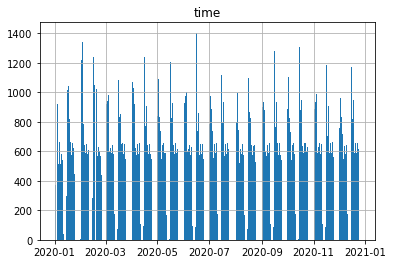

In [4]:
timestamp_str = "2020-07-15 11:00:00"
timestamp = pandas.to_datetime(timestamp_str, format='%Y-%m-%d %H:%M:%S', errors='ignore')

min_long = 35
max_long = 42
min_lat = 52
max_lat = 57

t = temp_df[(temp_df["longitude"] > min_long) & (temp_df["longitude"] < max_long) & (temp_df["latitude"] > min_lat) & (temp_df["latitude"] < max_lat)]
#t = t[t["time"] == timestamp]
print(len(t))
print(len(set(t['station_id'])))

t.hist(column=["time"], bins=300)

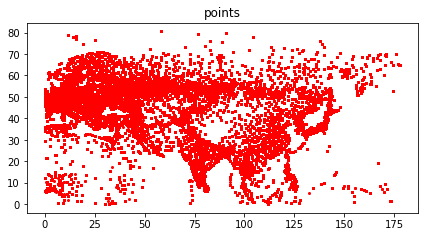

In [56]:
plt.figure(figsize=(7, 3.5))
plt.title(f'points')

plt.plot([val for val in t["longitude"]], [val for val in t["latitude"]], 'ro', markersize=1)


plt.show()


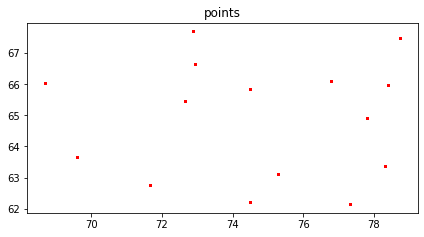

In [53]:
min_lat = 62
max_lat = 69
min_long = 68
max_long = 80

t = temp_df[(temp_df["longitude"] > min_long) & (temp_df["longitude"] < max_long) & (temp_df["latitude"] > min_lat) & (temp_df["latitude"] < max_lat)]

plt.figure(figsize=(7, 3.5))
plt.title(f'points')

plt.plot([val for val in t["longitude"]], [val for val in t["latitude"]], 'ro', markersize=1)


plt.show()

In [26]:
def t():
    data = xr.open_dataset('/home/jovyan/work/ship/calculate_points/results/0/auxhist7_d01_2020-07-15_11:00:00')
    print(data["T2"])

t()

ValueError: did not find a match in any of xarray's currently installed IO backends ['netcdf4', 'scipy']. Consider explicitly selecting one of the installed engines via the ``engine`` parameter, or installing additional IO dependencies, see:
http://xarray.pydata.org/en/stable/getting-started-guide/installing.html
http://xarray.pydata.org/en/stable/user-guide/io.html

In [14]:
def g():
    storage = {}
    for i in range(14):
        if i in [10, 13]:
            continue
        results_dir = f'/home/jovyan/work/ship/calculate_points/results/{i}'
        with open(os.path.join(results_dir, 'config.yml'), "r") as file:
            config = yaml.load(file, Loader=yaml.CLoader)
        lat = config["geogrid"]["LAT"]
        lon = config["geogrid"]["LON"]
        key = (lon, lat)
        if key in storage:
            print(f"Skip {i} result")

        paths = glob.glob(f"{results_dir}/auxhist7_*")
        data = xr.open_dataset(paths[0])

        geo_info = {
            #"min_lat": data.XLAT.data.min(),
            #"max_lat": data.XLAT.data.max(),
            "min_lon": data.XLONG.data.min(),
            "max_lon": data.XLONG.data.max(),
        }

        storage[key] = geo_info

    storage_keys = list(storage.keys())
    storage_keys.sort(key=lambda x:x[0])
    for key in storage_keys:
        print(f"key: {key}, data: {storage[key]}")

g()

Skip 3 result
Skip 4 result
Skip 5 result
Skip 6 result
Skip 7 result
Skip 8 result
Skip 11 result
Skip 12 result
key: (38.0, 55.0), data: {'min_lon': 31.984985, 'max_lon': 44.015015}
key: (70.0, 58.0), data: {'min_lon': 63.42563, 'max_lon': 76.57437}
key: (86.0, 55.0), data: {'min_lon': 79.984985, 'max_lon': 92.015015}
key: (102.0, 54.0), data: {'min_lon': 96.14758, 'max_lon': 107.85242}


In [25]:
def s():
    storage = {}
    for i in range(14):
        results_dir = f'/home/jovyan/work/ship/calculate_points/results/{i}'
        with open(os.path.join(results_dir, 'config.yml'), "r") as file:
            config = yaml.load(file, Loader=yaml.CLoader)
        lat = config["geogrid"]["LAT"]
        lon = config["geogrid"]["LON"]
        key = (lon, lat)
        if key in storage and i != 10:
            print(f"Skip {i} result")
            continue

        paths = glob.glob(f"{results_dir}/auxhist7_*")
        print(paths[0])
        data = xr.open_dataset(paths[0])

        geo_info = {
            "min_lat": data.XLAT.data.min(),
            "max_lat": data.XLAT.data.max(),
            "min_lon": data.XLONG.data.min(),
            "max_lon": data.XLONG.data.max(),
        }

        storage[key] = geo_info

    storage_keys = list(storage.keys())
    storage_keys.sort(key=lambda x:x[0])
    for key in storage_keys:
        print(f"key: {key}, data: {storage[key]}")

s()


#data = xr.open_dataset('/home/jovyan/work/ship/calculate_points/results/1/auxhist7_d01_2020-01-15_11:00:00')
#print(data["T2"])

/home/jovyan/work/ship/calculate_points/results/0/auxhist7_d01_2020-01-15_00:00:00
/home/jovyan/work/ship/calculate_points/results/1/auxhist7_d01_2020-07-15_00:00:00
/home/jovyan/work/ship/calculate_points/results/2/auxhist7_d01_2020-01-15_00:00:00
/home/jovyan/work/ship/calculate_points/results/3/auxhist7_d01_2020-07-15_00:00:00
Skip 4 result
Skip 5 result
Skip 6 result
Skip 7 result
Skip 8 result
Skip 9 result
/home/jovyan/work/ship/calculate_points/results/10/auxhist7_d01_2020-01-15_00:00:00
Skip 11 result
/home/jovyan/work/ship/calculate_points/results/12/auxhist7_d01_2020-01-15_00:00:00
Skip 13 result
key: (38.0, 55.0), data: {'min_lat': 51.70079, 'max_lat': 58.182426, 'min_lon': 31.984985, 'max_lon': 44.015015}
key: (54.0, 57.0), data: {'min_lat': 53.692398, 'max_lat': 60.18242, 'min_lon': 47.625214, 'max_lon': 60.374786}
key: (70.0, 58.0), data: {'min_lat': 54.68791, 'max_lat': 61.182426, 'min_lon': 63.42563, 'max_lon': 76.57437}
key: (86.0, 55.0), data: {'min_lat': 51.70079, 'm

In [67]:
data = xr.open_dataset('/home/jovyan/work/ship/calculate_points/geo_results/2/geo_em.d01.nc')

In [64]:
data

<xarray.Dataset>
Dimensions:  (Time: 0)
Dimensions without coordinates: Time
Data variables:
    Times    (Time) |S19 ...
Attributes: (12/131)
    TITLE:                            OUTPUT FROM WRF V4.3.1 MODEL
    START_DATE:                      2020-07-15_00:00:00
    SIMULATION_START_DATE:           2020-07-15_00:00:00
    WEST-EAST_GRID_DIMENSION:        100
    SOUTH-NORTH_GRID_DIMENSION:      100
    BOTTOM-TOP_GRID_DIMENSION:       45
    ...                              ...
    ISLAKE:                          21
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14
    HYBRID_OPT:                      2
    ETAC:                            0.2

In [38]:
print(",".join([key for key in data.data_vars.keys()]))

Times,T2


In [41]:
data["T2"][0][0][0]

<xarray.DataArray 'T2' ()>
array(288.37033, dtype=float32)
Coordinates:
    XLAT     float32 63.23
    XLONG    float32 53.13
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  TEMP at 2 M
    units:        K
    stagger:      
    coordinates:  XLONG XLAT XTIME

In [9]:
for i in [770]:
    if i in [23, 13]:
        continue
    path = f'/home/jovyan/work/ship/calculate_points/results/{i}/wrfout_d01_2020-07-15_00:00:00'
    data = xr.open_dataset(path)
    str_ = ",".join([key for key in data.data_vars.keys()])
    if str_ != "Times":
        print(str_)

In [32]:
geo_job_param_generator = get_wrf_launch_configuration(only_geo_params=True)

In [ ]:
import traceback as tb

while True:
    try:
        geo_scheduler = JobScheduler(
            job_params_generator=geo_job_param_generator,
            local_work_dir="/home/jovyan/work/ship/calculate_points",
            job_work_dir="/share/calculate_points",
            real_temperature_filename="/home/jovyan/work/ship/filtered_positive_real_data.csv",
            max_running_jobs=50,
            only_geo_params=True
        )
        geo_scheduler.work()
    except Exception as e:
        logging.error(f"Some exception happened {e}")
        tb.print_exc()
        sleep_some_random_time(3600, 60)
        continue
    else:
        break

In [ ]:
scheduler = JobScheduler(
    job_params_generator=job_param_generator,
    local_work_dir="/home/jovyan/work/ship/calculate_points",
    job_work_dir="/share/calculate_points",
    real_temperature_filename="/home/jovyan/work/ship/filtered_positive_real_data.csv",
    max_running_jobs=50,
    only_geo_params=False
)
scheduler.repair_jobs_state()

In [99]:
with open(os.path.join("/home/jovyan/work/ship/calculate_points", "filtered_jobs_state.json")) as f:
    state = json.load(f)
    completed_jobs = state["completed_jobs"]

In [100]:
jobs_map = {}

for job_ in completed_jobs:
    jobs_map[job_["id"]] = job_

def filter_by_lat_lon(lat, lon):
    return {
        job_id: job for job_id, job in jobs_map.items()
        if job["wrf_params"]["LAT"] == lat and job["wrf_params"]["LON"] == lon
            }

moscow_jobs = filter_by_lat_lon('55.00', '38.00')

In [101]:
moscow_rmse_by_day = {}

In [116]:
calculator = JobScoreCalculator(real_temperature_filename="/home/jovyan/work/ship/filtered_positive_real_data.csv")

In [106]:
def count_day_rmse(job_context, day):
    paths = glob.glob(f"{JobSchedulerContext.get_local_dir_with_results(job_context)}/auxhist7_d01_2020-07-{day}_*")
    paths.sort()
    return calculator.calculate_job_score(paths)

In [ ]:
for day in range(15, 22):
    day_info = []
    print(day)

    for job_id, job in moscow_jobs.items():
        day_rmse = count_day_rmse(job, day)
        day_info.append({"id": job_id, "wrf_params": job["wrf_params"], "score": day_rmse})
        print(f"{job_id} calculated")

    moscow_rmse_by_day[day] = day_info

15
22 calculated
26 calculated
62 calculated
70 calculated
92 calculated
95 calculated
109 calculated
111 calculated
119 calculated
133 calculated
137 calculated
146 calculated
158 calculated
169 calculated
178 calculated
222 calculated
233 calculated
238 calculated
253 calculated
274 calculated
283 calculated
287 calculated
295 calculated
312 calculated
313 calculated
316 calculated
319 calculated
323 calculated
342 calculated
348 calculated
358 calculated
372 calculated
383 calculated
387 calculated
405 calculated
432 calculated
435 calculated
450 calculated
453 calculated
509 calculated
516 calculated
520 calculated
552 calculated
567 calculated
603 calculated
614 calculated
634 calculated
642 calculated
648 calculated
667 calculated
738 calculated
822 calculated
791 calculated
817 calculated
792 calculated
818 calculated
823 calculated
846 calculated
833 calculated
836 calculated
858 calculated
855 calculated
856 calculated
871 calculated
842 calculated
880 calculated
877 calculate

In [ ]:
with open("/home/jovyan/work/ship/calculate_points/moscow_rmse_by_day.json", 'w') as f:
    json.dump(moscow_rmse_by_day, f)

In [110]:
moscow_rmse_by_day

{15: [{'id': '22',
   'wrf_params': {'MP_PHYSICS': 8,
    'RA_LW_PHYSICS': 4,
    'RA_SW_PHYSICS': 4,
    'RADT': 6,
    'SF_SFCLAY_PHYSICS': 1,
    'SF_SURFACE_PHYSICS': 3,
    'SF_URBAN_PHYSICS': 1,
    'BL_PBL_PHYSICS': 11,
    'CU_PHYSICS': 3,
    'DIFF_6TH_OPT': 2,
    'DIFF_OPT': 1,
    'KM_OPT': 4,
    'LAT': '55.00',
    'LON': '38.00',
    'E_WE': 100,
    'E_SN': 100,
    'DX': 6000,
    'TIME_STEP': 30,
    'START_DATE': '2020-07-15_00:00:00',
    'END_DATE': '2020-07-22_00:00:00',
    'INTERVAL_SECONDS': '10800'},
   'score': {'value': 1.9819470843057942,
    'points_count_by_path': [0,
     0,
     0,
     0,
     0,
     0,
     0,
     0,
     0,
     9,
     98,
     107,
     116,
     205,
     214,
     223,
     377,
     386,
     395,
     537,
     545,
     552,
     633,
     641],
    'dropped_points_count_by_path': [0,
     0,
     0,
     0,
     0,
     0,
     0,
     0,
     0,
     5,
     0,
     0,
     5,
     0,
     0,
     10,
     0,
     0,
     

In [112]:
jobs_map["1930"]

{'id': '1930',
 'kuber_job_id': 'calculate-points-1930',
 'wrf_params': {'MP_PHYSICS': 8,
  'RA_LW_PHYSICS': 4,
  'RA_SW_PHYSICS': 5,
  'RADT': 6,
  'SF_SFCLAY_PHYSICS': 1,
  'SF_SURFACE_PHYSICS': 2,
  'SF_URBAN_PHYSICS': 1,
  'BL_PBL_PHYSICS': 7,
  'CU_PHYSICS': 3,
  'DIFF_6TH_OPT': 2,
  'DIFF_OPT': 1,
  'KM_OPT': 4,
  'LAT': '55.00',
  'LON': '38.00',
  'E_WE': 100,
  'E_SN': 100,
  'DX': 6000,
  'TIME_STEP': 30,
  'START_DATE': '2020-07-15_00:00:00',
  'END_DATE': '2020-07-22_00:00:00',
  'INTERVAL_SECONDS': '10800'},
 'local_dir_with_results': '/home/jovyan/work/ship/calculate_points/results/1930',
 'job_dir_with_results': '/share/calculate_points/results/1930',
 'score': None,
 'error_msg': None,
 'score_result': {'value': 1.805004718879945,
  'points_count_by_path': [0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   9,
   98,
   107,
   116,
   205,
   214,
   223,
   377,
   386,
   395,
   537,
   545,
   552,
   633,
   641,
   648,
   800,
   808,
   817,
   971,
   980,


In [117]:
day_info = {}

def process_day(day):
    paths = glob.glob(f"{JobSchedulerContext.get_local_dir_with_results(jobs_map['1930'])}/auxhist7_d01_2020-07-{day}_*")
    paths.sort()
    real_temperatures, wrf_calculated_temperatures = calculator.calculate_job_score(paths, return_raw=True)
    return {"real": real_temperatures, "predict": wrf_calculated_temperatures}

for day in range(15, 22):
    day_info[day] = process_day(day)

Plotting mae data


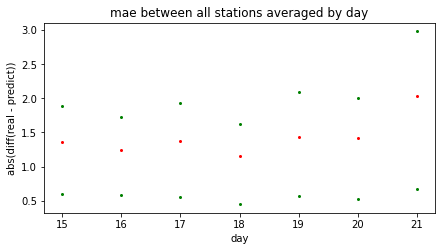

In [120]:
def plot_mae_data(data):
    print(f'Plotting mae data')

    days = [i for i in range(15, 22)]
    plt.figure(figsize=(7, 3.5))
    plt.title(f'mae between all stations averaged by day')
    plt.xlabel('day')
    plt.ylabel('abs(diff(real - predict))')

    def calc_random_var(info):
        return np.absolute(info['real'] - info['predict'])

    perc25 = {day: np.percentile(calc_random_var(data[day]), 25) for day in days}
    perc75 = {day: np.percentile(calc_random_var(data[day]), 75) for day in days}
    means = {day: np.mean(calc_random_var(data[day])) for day in days}

    plt.plot([i for i in days], [means[i] for i in days], 'ro', markersize=2)
    plt.plot([i for i in days], [perc25[i] for i in days], 'go', markersize=2)
    plt.plot([i for i in days], [perc75[i] for i in days], 'go', markersize=2)

    plt.show()

plot_mae_data(day_info)

In [122]:
def process_x(x):
    return {"real": list(x["real"]), "predict": list(x["predict"])}


day_info_copy = {day: process_x(info) for day, info in day_info.items()}

with open("/home/jovyan/work/ship/calculate_points/moscow_best_params_info_by_day.json", 'w') as f:
    json.dump(day_info_copy, f)